In [1]:
import os
import sys
import random
import math
import re
import time
import numpy as np
import cv2
import matplotlib
import matplotlib.pyplot as plt

from config import Config
import utils
import model_101 as modellib
import visualize
from model import log
from dsb2018 import Dsb2018Dataset
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')


%matplotlib inline

def get_ax(rows=1, cols=1, size=8):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Change the default size attribute to control the size
    of rendered images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

# Root directory of the project
ROOT_DIR = os.getcwd()

/home/keven/miniconda3/envs/tensorflow/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [2]:
# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "dsb2018_logs")

# Local path to trained weights file
COCO_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")
# Download COCO trained weights from Releases if needed
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

Size of train data:603
Size of val data:67


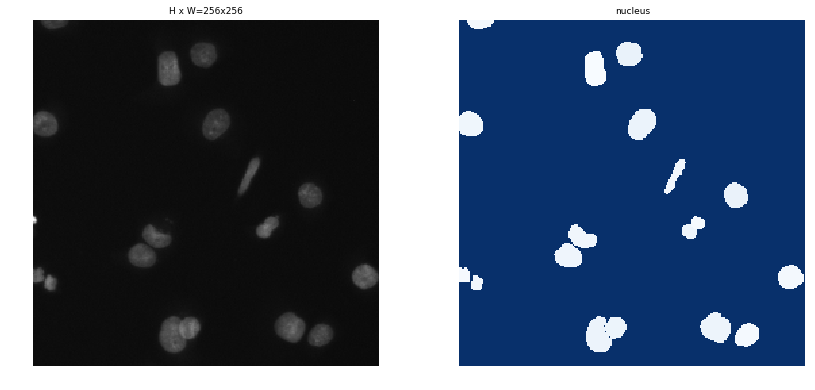

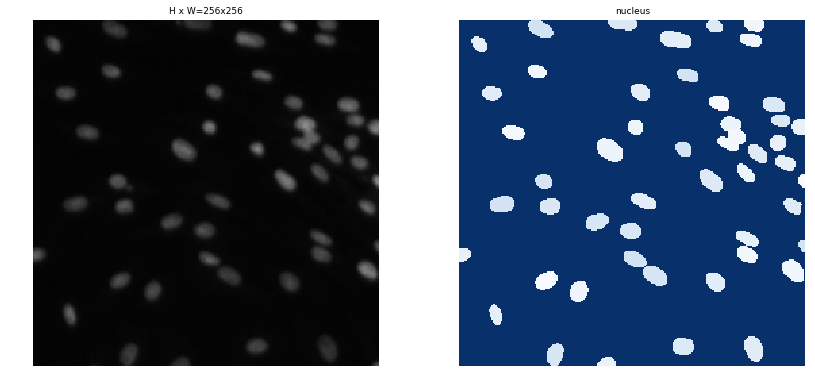

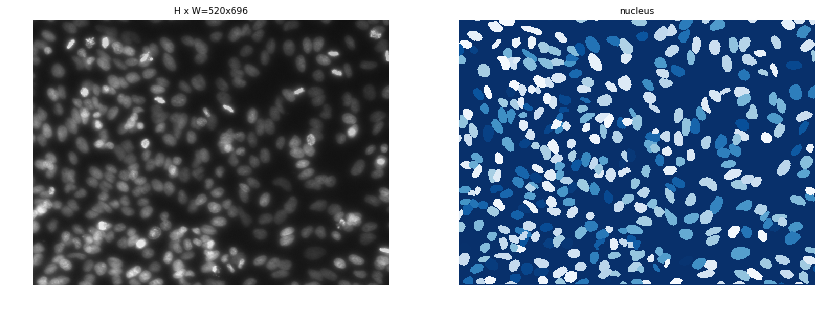

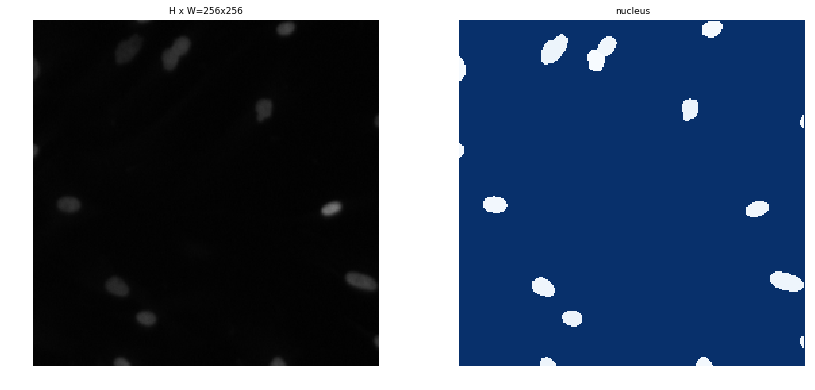

In [3]:
# Training dataset
train_data = Dsb2018Dataset()
train_data.load_dsb2018('../DSB2018')
train_data.prepare()

val_data = Dsb2018Dataset()
val_data.load_dsb2018('../DSB2018', is_trainset=False)
val_data.prepare()
print("Size of train data:{}".format(len(train_data.image_ids)))
print("Size of val data:{}".format(len(val_data.image_ids)))


#Load and display random samples
image_ids = np.random.choice(train_data.image_ids, 2)
for image_id in image_ids:
    image = train_data.load_image(image_id)
    mask, class_ids = train_data.load_mask(image_id)
    visualize.display_top_masks(image, mask, class_ids, train_data.class_names, limit=1)
    
    
#Load and display random samples
image_ids = np.random.choice(val_data.image_ids, 2)
for image_id in image_ids:
    image = val_data.load_image(image_id)
    mask, class_ids = val_data.load_mask(image_id)
    visualize.display_top_masks(image, mask, class_ids, val_data.class_names, limit=1)


In [4]:
class Dsb2018Config(Config):
    """Configuration for training on the toy shapes dataset.
    Derives from the base Config class and overrides values specific
    to the toy shapes dataset.
    """
    # Give the configuration a recognizable name
    NAME = "600_roi_size_768x512"

    # Train on 1 GPU and 8 images per GPU. We can put multiple images on each
    # GPU because the images are small. Batch size is 8 (GPUs * images/GPU).
    GPU_COUNT = 1
    IMAGES_PER_GPU = 2

    # Number of classes (including background)
    NUM_CLASSES = 1 + 1  # background + 3 shapes

    # Use small images for faster training. Set the limits of the small side
    # the large side, and that determines the image shape.
    IMAGE_MIN_DIM = 768
    IMAGE_MAX_DIM = 512
    
    USE_MINI_MASK = True
    
    #MINI_MASK_SHAPE = (112, 112)  # (height, width) of the mini-mask


    # Use smaller anchors because our image and objects are small
    RPN_ANCHOR_SCALES = (8, 16, 32, 64, 128)  # anchor side in pixels

    # Reduce training ROIs per image because the images are small and have
    # few objects. Aim to allow ROI sampling to pick 33% positive ROIs.
    
    #TODO: in trainning time, set both of these two as 100 and change to 200 during predication time!
    TRAIN_ROIS_PER_IMAGE = 600
    
    #RPN_TRAIN_ANCHORS_PER_IMAGE = 512

    #RPN_NMS_THRESHOLD = 0.7
    
    DETECTION_MAX_INSTANCES = 512
    
    MAX_GT_INSTANCES = 300
    
    RPN_ANCHOR_RATIOS = [0.5,1, 2]

    # Use a small epoch since the data is simple
    STEPS_PER_EPOCH = 603

    # use small validation steps since the epoch is small
    VALIDATION_STEPS = 34
    
    DETECTION_MIN_CONFIDENCE = 0.7



config = Dsb2018Config()

# Create model in training mode
model = modellib.MaskRCNN(mode="training", config=config,
                          model_dir=MODEL_DIR)

# Which weights to start with?
init_with = "coco"  # imagenet, coco, or last

if init_with == "imagenet":
    model.load_weights(model.get_imagenet_weights(), by_name=True)
elif init_with == "coco":
    # Load weights trained on MS COCO, but skip layers that
    # are different due to the different number of classes
    # See README for instructions to download the COCO weights
    model.load_weights(COCO_MODEL_PATH, by_name=True,
                       exclude=["mrcnn_class_logits", "mrcnn_bbox_fc",
                                "mrcnn_bbox", "mrcnn_mask"])
elif init_with == "last":
    # Load the last model you trained and continue training
    model.load_weights(model.find_last()[1], by_name=True)

print("model ready!")

using architecture:resnet101
model ready!


train data:


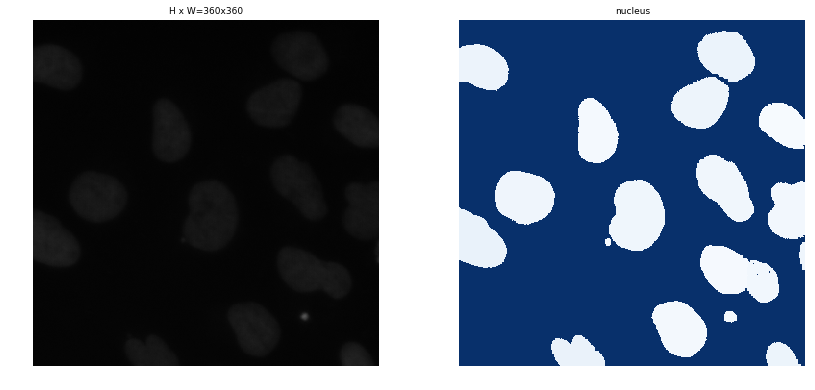

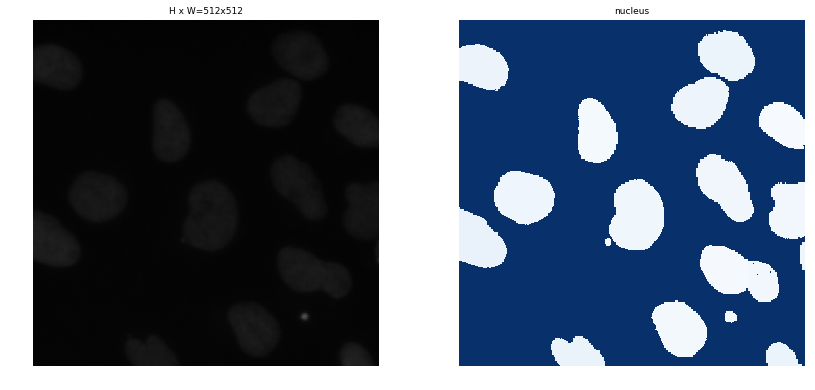

val data:


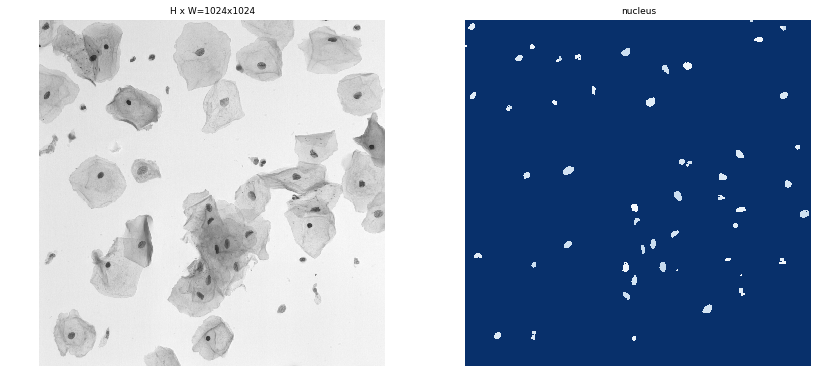

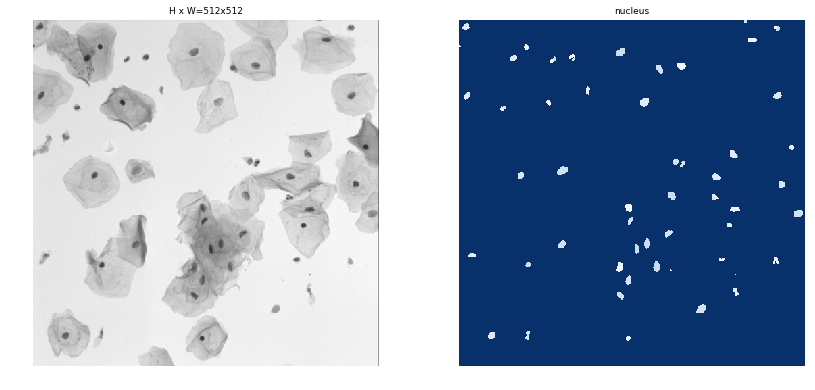

In [19]:
from skimage.io import imread, imshow, imread_collection, concatenate_images

print("train data:")

image_ids = np.random.choice(train_data.image_ids, 1)
for image_id in image_ids:
    image = train_data.load_image(image_id)
    mask, class_ids = train_data.load_mask(image_id)
    visualize.display_top_masks(image, mask, class_ids, train_data.class_names, limit=1)
    output_image, _, class_ids, _, output_masks = modellib.load_image_gt(train_data, config, image_id, augment=True, use_mini_mask = False)
    visualize.display_top_masks(output_image, output_masks, class_ids, train_data.class_names, limit=1)
  

print("val data:")
image_ids = np.random.choice(val_data.image_ids, 1)
for image_id in image_ids:
    image = val_data.load_image(image_id)
    mask, class_ids = val_data.load_mask(image_id)
    visualize.display_top_masks(image, mask, class_ids, train_data.class_names, limit=1)
    output_image, _, class_ids, _, output_masks = modellib.load_image_gt(val_data, config, image_id, augment=False, use_mini_mask = False)
    visualize.display_top_masks(output_image, output_masks, class_ids, train_data.class_names, limit=1)



In [ ]:
# Train the head branches
# Passing layers="heads" freezes all layers except the head
# layers. You can also pass a regular expression to select
# which layers to train by name pattern.

LEARNING_RATE=1e-5

# model.train(train_data, val_data,
#             learning_rate=config.LEARNING_RATE,
#             epochs=800,
#             layers='all')

model.train(train_data, val_data,
             learning_rate=config.LEARNING_RATE,
             epochs=200,
             layers='heads')


Starting at epoch 0. LR=0.001

Checkpoint Path: /home/keven/data_science_bowl_2018/Mask_RCNN/dsb2018_logs/600_roi_size_768x51220180314T1002/mask_rcnn_600_roi_size_768x512_{epoch:04d}.h5
Selecting layers to train
fpn_c5p5               (Conv2D)
fpn_c4p4               (Conv2D)
fpn_c3p3               (Conv2D)
fpn_c2p2               (Conv2D)
fpn_p5                 (Conv2D)
fpn_p2                 (Conv2D)
fpn_p3                 (Conv2D)
fpn_p4                 (Conv2D)
In model:  rpn_model
    rpn_conv_shared        (Conv2D)
    rpn_class_raw          (Conv2D)
    rpn_bbox_pred          (Conv2D)
mrcnn_mask_conv1       (TimeDistributed)
mrcnn_mask_bn1         (TimeDistributed)
mrcnn_mask_conv2       (TimeDistributed)
mrcnn_mask_bn2         (TimeDistributed)
mrcnn_class_conv1      (TimeDistributed)
mrcnn_class_bn1        (TimeDistributed)
mrcnn_mask_conv3       (TimeDistributed)
mrcnn_mask_bn3         (TimeDistributed)
mrcnn_class_conv2      (TimeDistributed)
mrcnn_class_bn2        (TimeDistr

In [6]:
import scipy.misc
        
import json
from skimage.io import imread, imshow, imread_collection, concatenate_images
import matplotlib.pyplot as plt
from utils import resize_image, resize_mask

class InferenceConfig(Dsb2018Config):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

inference_config = InferenceConfig()

# Recreate the model in inference mode
model = modellib.MaskRCNN(mode="inference", 
                          config=inference_config,
                          model_dir=MODEL_DIR)

# Get path to saved weights
# Either set a specific path or find last trained weights
# model_path = os.path.join(ROOT_DIR, ".h5 file name here")
# model_path = model.find_last()[1]
model_path = '/home/keven/data_science_bowl_2018/Mask_RCNN/dsb2018_logs/600_roi20180314T0007/mask_rcnn_600_roi_0026.h5'
print(model_path)

# Load trained weights (fill in path to trained weights here)
assert model_path != "", "Provide path to trained weights"
print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)

def unpad(img, pad):
    y,x = img.shape
    top = pad[0][0]
    bottom = pad[0][1]
    left = pad[1][0]
    right = pad[1][1]
    
    startx = left
    endx = x-right
    starty = top
    endy = y-bottom
        
    return img[starty:endy,startx:endx]

def unpad3d(img, pad):
    y,x, _ = img.shape
    top = pad[0][0]
    bottom = pad[0][1]
    left = pad[1][0]
    right = pad[1][1]
    
    startx = left
    endx = x-right
    starty = top
    endy = y-bottom
        
    return img[starty:endy,startx:endx, :]


def revert_size(image, origin_size):
    result = scipy.misc.imresize(
            image,(origin_size[0],origin_size[1]))
    return result
    
def revert_size3d(image, origin_size):
    return scipy.misc.imresize(
            image, (origin_size[0], origin_size[1]))

def revert_resizing_3d(img, origin_size, padding):
    unpadding = unpad3d(img, padding)
    return revert_size3d(unpadding, origin_size)

def revert_resizing(img, origin_size, padding):
    unpadding = unpad(img, padding)
    try:
        return revert_size(unpadding, origin_size)
    except ValueError:
        print("error img, shape:{}, unpadding shape:{}, scale:{}, padding:{}"
              .format(img.shape, unpadding.shape, scale, padding))

def load_testset(pathname):
    dictionaries = []
    with open(pathname) as data:
        dictionaries = json.load(data)
    return dictionaries

base_dir = '../DSB2018'

test_set = load_testset(os.path.join(base_dir, 'test.json'))

using architecture:resnet101
/home/keven/data_science_bowl_2018/Mask_RCNN/dsb2018_logs/600_roi20180314T0007/mask_rcnn_600_roi_0026.h5
Loading weights from  /home/keven/data_science_bowl_2018/Mask_RCNN/dsb2018_logs/600_roi20180314T0007/mask_rcnn_600_roi_0026.h5


original_image           shape: (512, 512, 3)         min:    4.00000  max:   53.00000
image_meta               shape: (10,)                 min:    0.00000  max:  512.00000
gt_class_id              shape: (33,)                 min:    1.00000  max:    1.00000
gt_bbox                  shape: (33, 4)               min:    0.00000  max:  512.00000
gt_mask                  shape: (512, 512, 33)        min:    0.00000  max:  255.00000


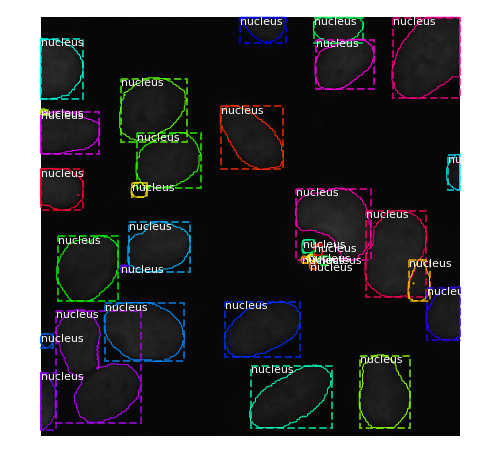

Processing 1 images
image                    shape: (512, 512, 3)         min:    4.00000  max:   53.00000
molded_images            shape: (1, 512, 512, 3)      min: -119.70000  max:  -50.90000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


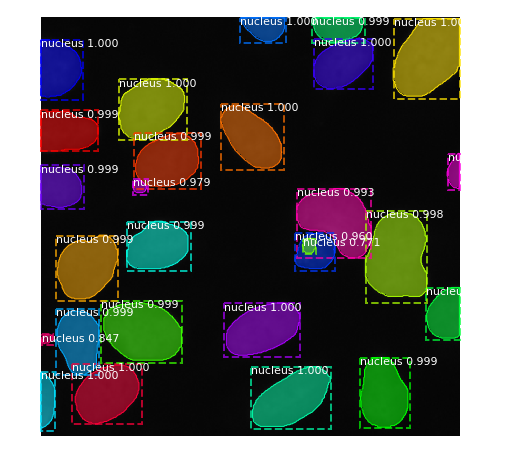

In [8]:
# Test on a random train image
image_id = random.choice(train_data.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(train_data, inference_config, 
                           image_id, use_mini_mask=False)

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)


visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            train_data.class_names, figsize=(8, 8))

# mask, class_ids = train_data.load_mask(image_id)
# visualize.display_top_masks(original_image, mask, class_ids, train_data.class_names, limit=1)

results = model.detect([original_image], verbose=1)

r = results[0]
visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                            train_data.class_names, r['scores'], ax=get_ax())

original_image           shape: (512, 512, 3)         min:    0.00000  max:  151.00000
image_meta               shape: (10,)                 min:    0.00000  max:  696.00000
gt_class_id              shape: (101,)                min:    1.00000  max:    1.00000
gt_bbox                  shape: (101, 4)              min:    0.00000  max:  512.00000
gt_mask                  shape: (512, 512, 101)       min:    0.00000  max:  255.00000
img size:(512, 512, 3)
mask size:(512, 512, 101)


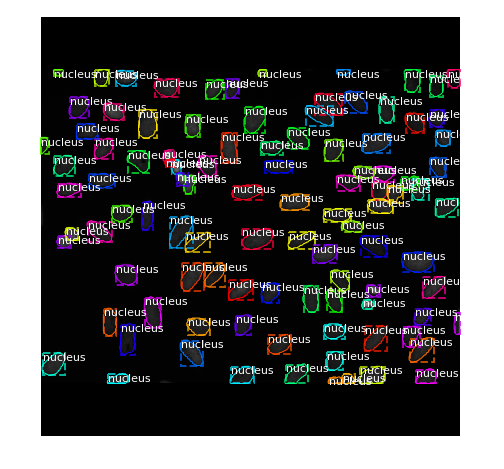

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  151.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:   47.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


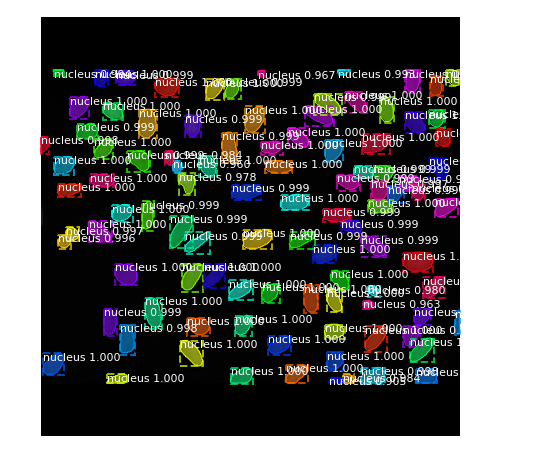

In [11]:
# Test on a random validation image
image_id = random.choice(val_data.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(val_data, inference_config, 
                           image_id, use_mini_mask=False)

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)

print("img size:{}".format(original_image.shape))
print("mask size:{}".format(gt_mask.shape))

visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            val_data.class_names, figsize=(8, 8))


results = model.detect([original_image], verbose=1)

r = results[0]
visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                            val_data.class_names, r['scores'], ax=get_ax())



52
{'image': {'checksum': '60e58d0b01c10ce966f805e8ef879c09', 'pathname': '505bc0a3928d8aef5ce441c5a611fdd32e1e8eccdc15cc3a52b88030acb50f81.png', 'shape': {'r': 512, 'c': 640, 'channels': 3}}, 'objects': []}
original shape:(512, 640, 3)
resized shape:(512, 512, 3), scale:0.8, padding:[(51, 51), (0, 0), (0, 0)]


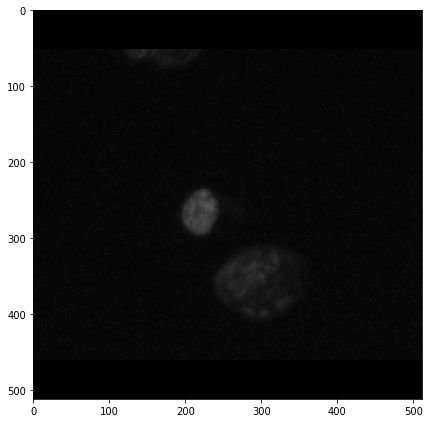

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:   97.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:   -6.90000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


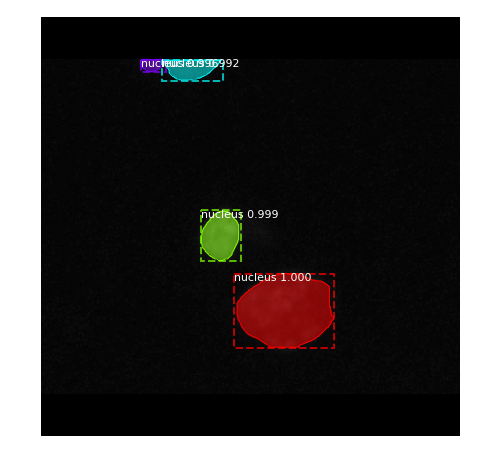

mask shape:(512, 512, 1)
(512, 410, 1)


In [11]:
# Test on a random test image

i = random.randint(0, len(test_set)-1)
print(i)
test = test_set[10]
print(test)
test_img = imread(os.path.join(base_dir, 'images', test['image']['pathname']))
print("original shape:{}".format(test_img.shape))
test_img,_, scale,padding = resize_image(test_img, min_dim=512,max_dim=512, padding=True)
print("resized shape:{}, scale:{}, padding:{}".format(test_img.shape,scale, padding))
plt.figure(figsize=(6,6))
imshow(test_img)
plt.show()

results = model.detect([test_img], verbose=1)
r = results[0]
visualize.display_instances(test_img, r['rois'], r['masks'], r['class_ids'], 
                            train_data.class_names, r['scores'], ax=get_ax())
first_mask = r['masks'][:,:,0]
first_mask = np.expand_dims(first_mask, axis=2)
print('mask shape:{}'.format(first_mask.shape))
print(resize_mask(first_mask, scale, padding).shape)

In [12]:
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')
# Compute VOC-Style mAP @ IoU=0.5
# Running on 10 images. Increase for better accuracy.
# image_ids = np.random.choice(val_data.image_ids, 65)
APs = []
half_APs = []
for i, image_id in tqdm(enumerate(val_data.image_ids), total = len(val_data.image_ids)):
    # Load image and ground truth data
    image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(val_data, inference_config,
                               image_id, use_mini_mask=False)
    molded_images = np.expand_dims(modellib.mold_image(image, inference_config), 0)
    # Run object detection
    results = model.detect([image], verbose=0)
    r = results[0]
    # Compute AP
    # Compute AP
    for iou in [0.5, 0.55, 0.6, 0.65, 0.7,0.75, 0.8,0.85, 0.9,0.95]:
        AP, _, _, _ =\
            utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                             r["rois"], r["class_ids"], r["scores"], r['masks'], iou_threshold=iou)
        
        APs.append(AP)
        if iou == 0.5:
            half_APs.append(AP)
    
print("0.5-0.95 mAP: ", np.mean(APs))
print("0.5 mAP: ", np.mean(half_APs))

100%|██████████| 67/67 [03:07<00:00,  2.80s/it]

0.5-0.95 mAP:  0.5888912724869325
0.5 mAP:  0.8405689918964085


origin_size:(256, 256, 3)
Processing 1 images
image                    shape: (512, 512, 3)         min:    1.00000  max:  121.00000
molded_images            shape: (1, 512, 512, 3)      min: -122.70000  max:   17.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000
(512, 512, 11)


/home/keven/miniconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel_launcher.py:38: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/home/keven/miniconda3/envs/tensorflow/lib/python3.6/site-packages/skimage/io/_plugins/matplotlib_plugin.py:51: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  out_of_range_float = (np.issubdtype(image.dtype, np.float) and


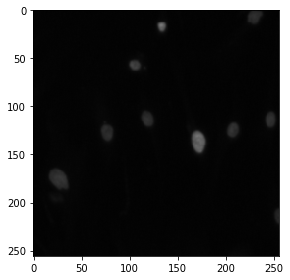

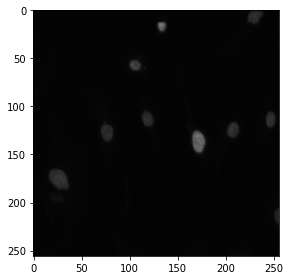

(512, 512)


/home/keven/miniconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel_launcher.py:33: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.


In [7]:
i = 0
# testing revert_resizing
img_data = test_set[i]
origin_img = imread(os.path.join(base_dir, 'images', img_data['image']['pathname']))
origin_size = origin_img.shape
print("origin_size:{}".format(origin_size))
resized_img,_, scale,padding = resize_image(origin_img, min_dim=512,max_dim=512, padding=True)

results = model.detect([resized_img], verbose=1)
masks = results[0]['masks']


revert_img = revert_resizing_3d(resized_img, origin_size, padding)

assert(revert_img.shape == origin_img.shape)

print(masks.shape)
imshow(revert_img)
plt.show()

imshow(origin_img)
plt.show()
print(masks[:,:,0].shape)


for i in range(masks.shape[-1]):
    mask = masks[:,:, i]
    reverted = revert_resizing(mask, origin_size, padding)
        
        
# for i in range(masks.shape[-1]):
#     print(masks[:,:,i].shape)
#     print(revert_resizing(masks[:,:,i], scale, padding).shape)
#     imshow(np.squeeze(masks[:,:,i]))
#     plt.show()

origin_size:(512, 640, 3)
Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  138.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:   34.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


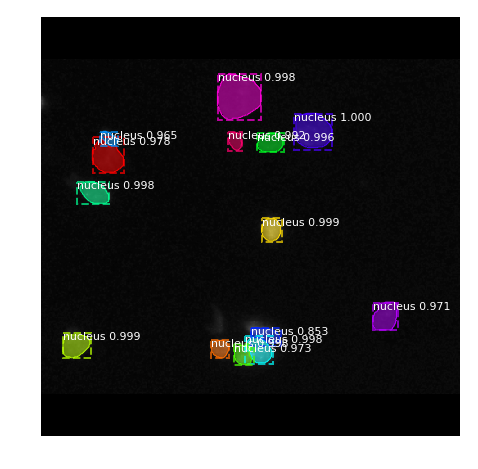

/home/keven/miniconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel_launcher.py:40: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/home/keven/miniconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel_launcher.py:34: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/home/keven/miniconda3/envs/tensorflow/lib/python3.6/site-packages/skimage/io/_plugins/matplotlib_plugin.py:51: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  out_of_range_float = (np.issubdtype(image.dtype, np.float) and
/home/keven/miniconda3/envs/tensorflow/lib/python3.6/site-packages/skimage/io/_plugins/matplotlib_plugin.py:74: UserWarning: Low image data 

14


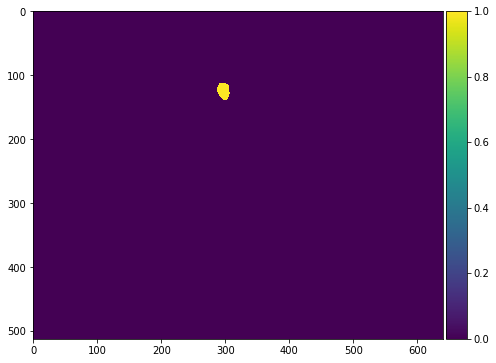

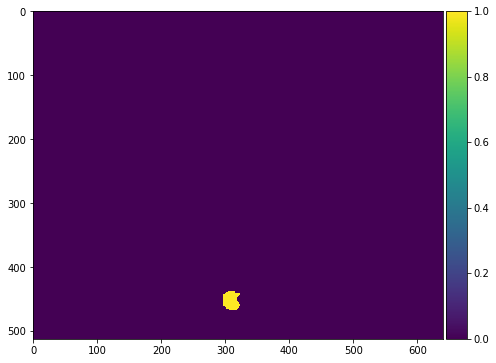

(array([], dtype=int64), array([], dtype=int64))


In [11]:
# debug image
i = 2
# testing revert_resizing
img_data = test_set[i]
origin_img = imread(os.path.join(base_dir, 'images', img_data['image']['pathname']))
origin_size = origin_img.shape
print("origin_size:{}".format(origin_size))
resized_img,_, scale,padding = resize_image(origin_img, min_dim=512,max_dim=512, padding=True)

results = model.detect([resized_img], verbose=1)
masks = results[0]['masks']
r = results[0]
visualize.display_instances(resized_img, r['rois'], r['masks'], r['class_ids'], 
                            train_data.class_names, r['scores'], ax=get_ax())



revert_img = revert_resizing_3d(resized_img, origin_size, padding)

assert(revert_img.shape == origin_img.shape)

reverted_masks = []
for i in range(masks.shape[-1]):
    mask = masks[:,:, i]
    reverted = revert_resizing(mask, origin_size, padding)
    reverted_masks.append(reverted)


# inter = reverted_masks[2]*reverted_masks[5]
# print(np.nonzero(inter))



print(len(reverted_masks))
plt.figure(figsize=(7,7))
imshow(np.squeeze(reverted_masks[8]))
plt.show()
plt.figure(figsize=(7,7))
imshow(np.squeeze(reverted_masks[10]))
plt.show()

inter = reverted_masks[8]*reverted_masks[10]
print(np.nonzero(inter))
row, col = np.nonzero(inter)
if len(row)>0:
    reverted_masks[8][row, col] = 0
# for i in range(len(reverted_masks)):
#     for j in range(i+1,len(reverted_masks)):
#         print("i:{}, j:{}".format(i,j))
#         inter = reverted_masks[i]*reverted_masks[j]
#         assert(len(np.nonzero(inter)[0]) == 0)


In [12]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

in total 65 images to predict


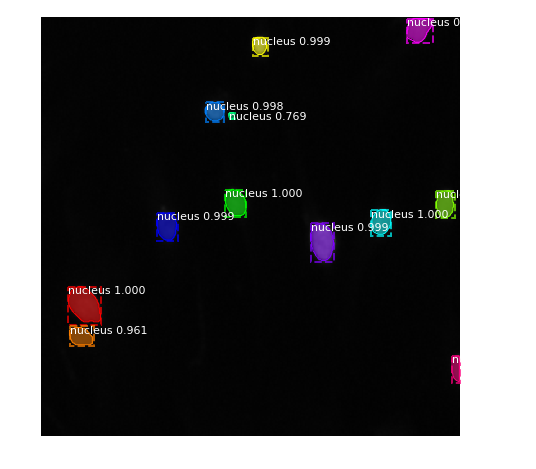

12 masks detected, lowest score is 0.7685950994491577


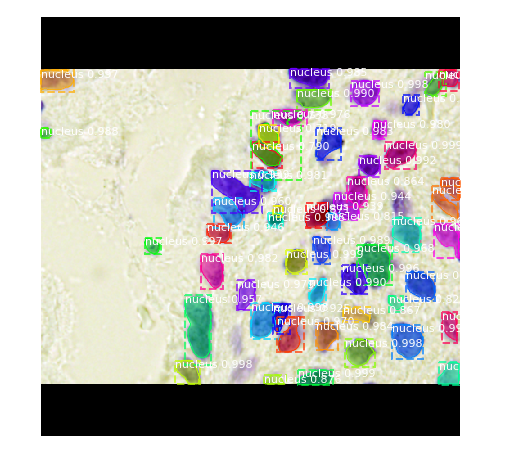

53 masks detected, lowest score is 0.7193202972412109


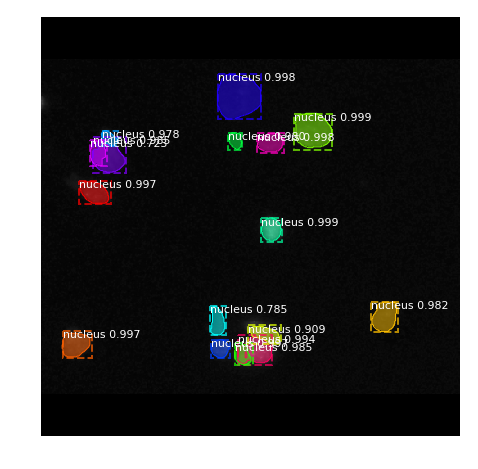

16 masks detected, lowest score is 0.7230362892150879


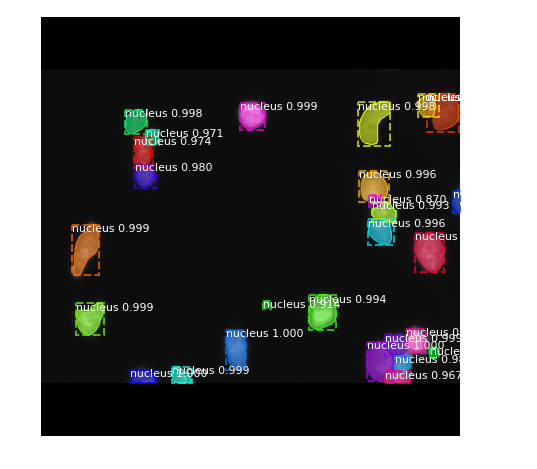

27 masks detected, lowest score is 0.7570614218711853


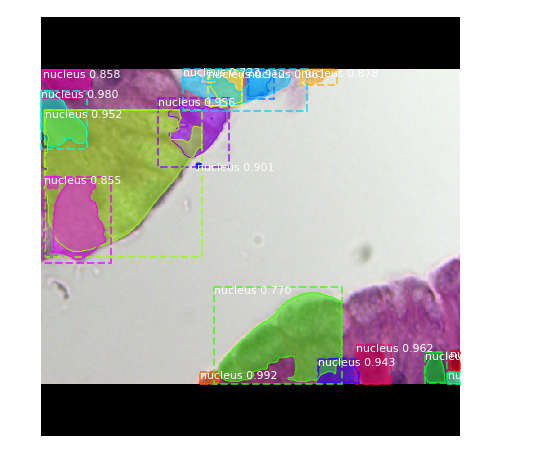

17 masks detected, lowest score is 0.7222031950950623


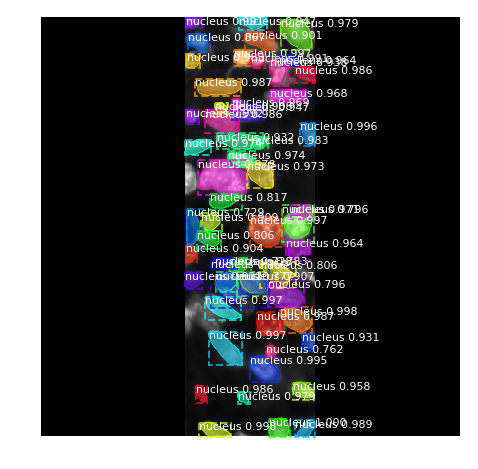

55 masks detected, lowest score is 0.7283796668052673


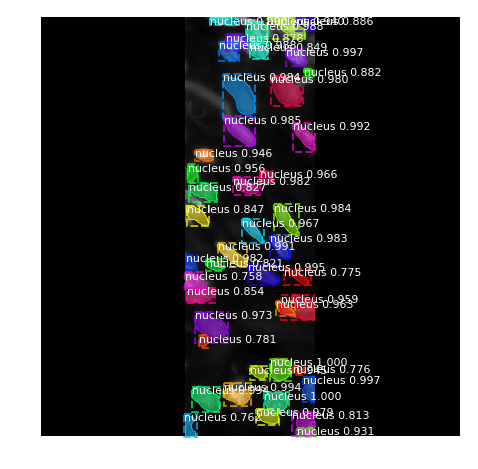

44 masks detected, lowest score is 0.7577365636825562


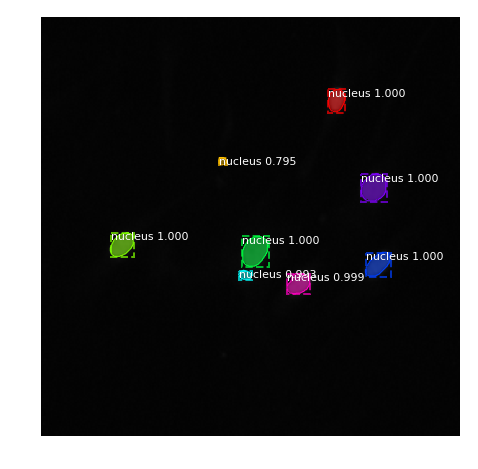

8 masks detected, lowest score is 0.7947049140930176


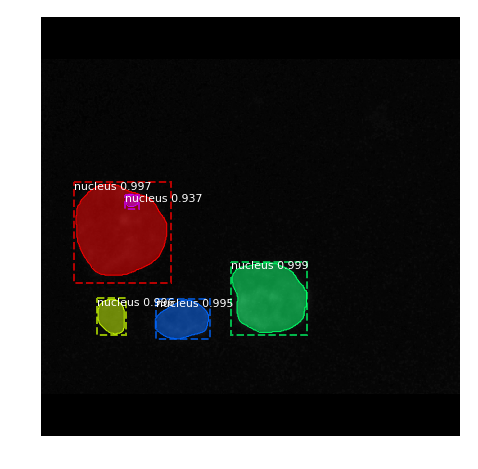

5 masks detected, lowest score is 0.9366416931152344


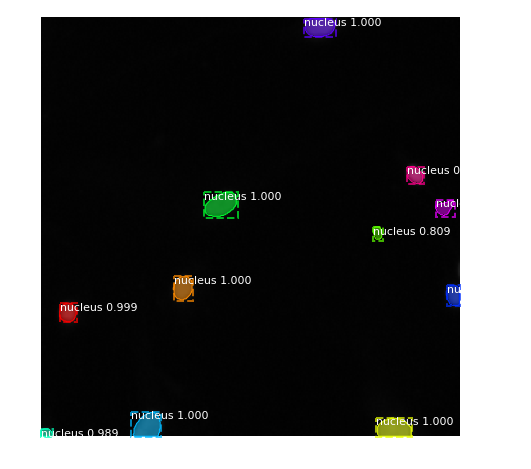

11 masks detected, lowest score is 0.8088587522506714


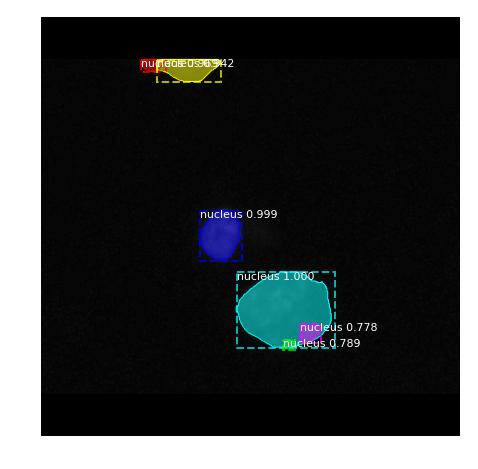

6 masks detected, lowest score is 0.7776808142662048


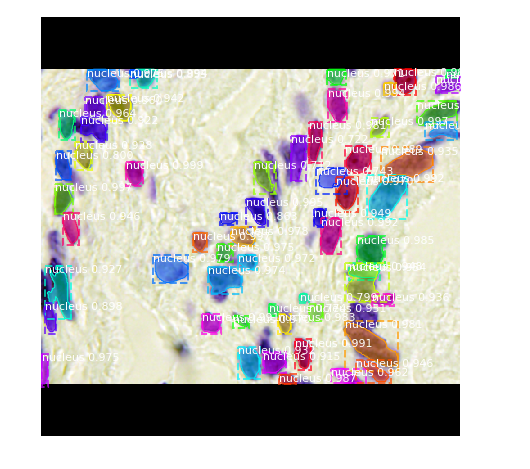

59 masks detected, lowest score is 0.7123616933822632


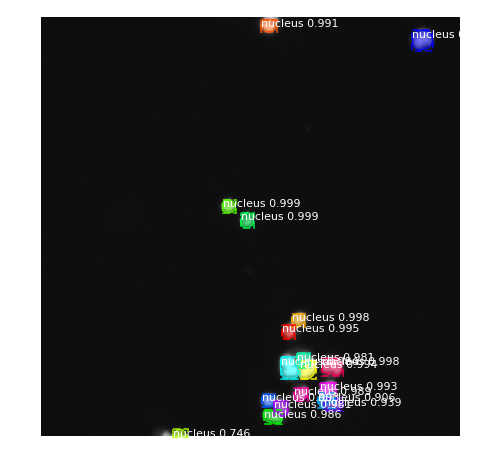

18 masks detected, lowest score is 0.7459414005279541


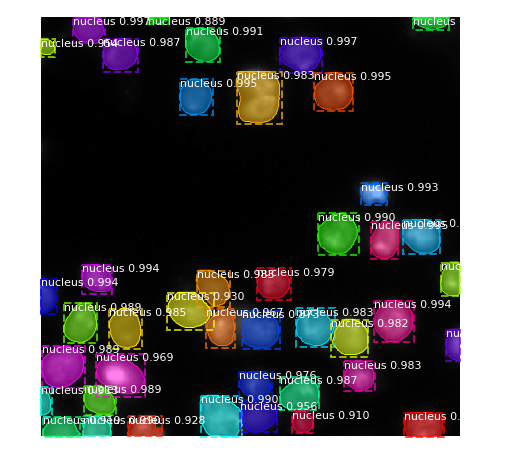

42 masks detected, lowest score is 0.8729281425476074


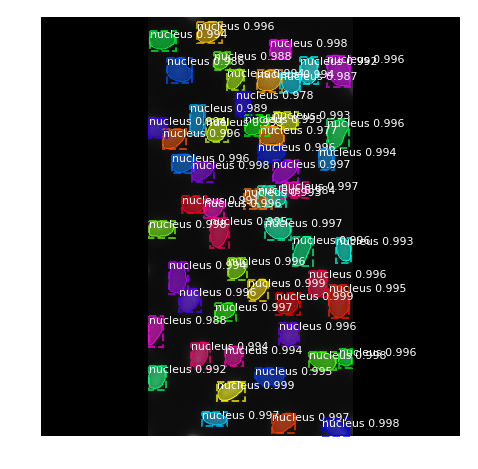

54 masks detected, lowest score is 0.9768326282501221


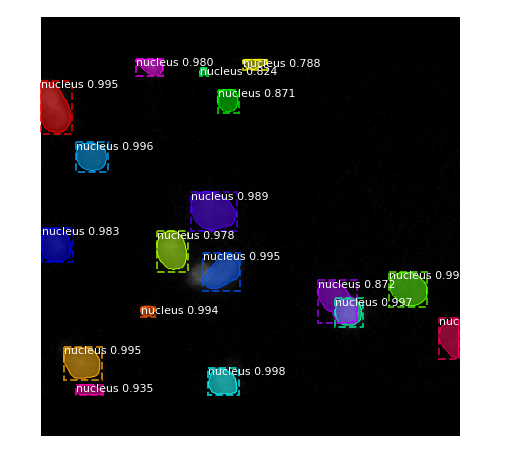

18 masks detected, lowest score is 0.7883707880973816


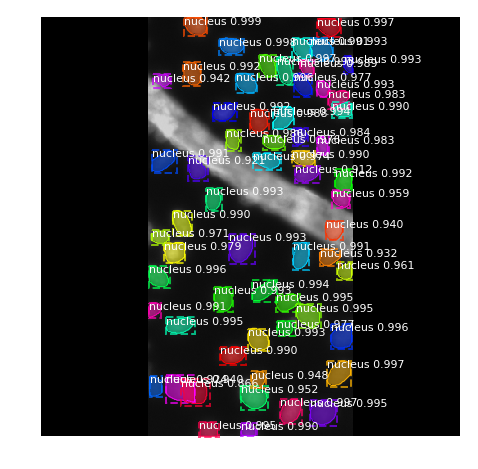

60 masks detected, lowest score is 0.8660944700241089


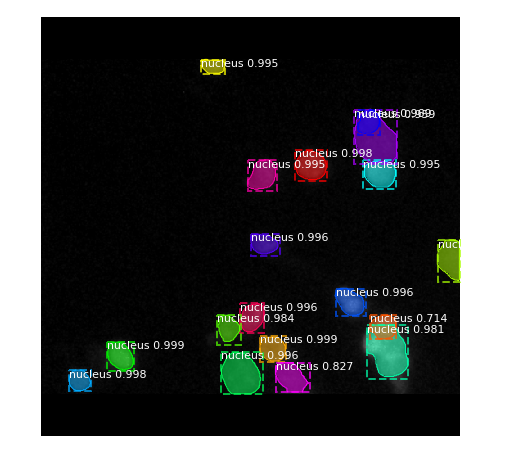

18 masks detected, lowest score is 0.7143992185592651


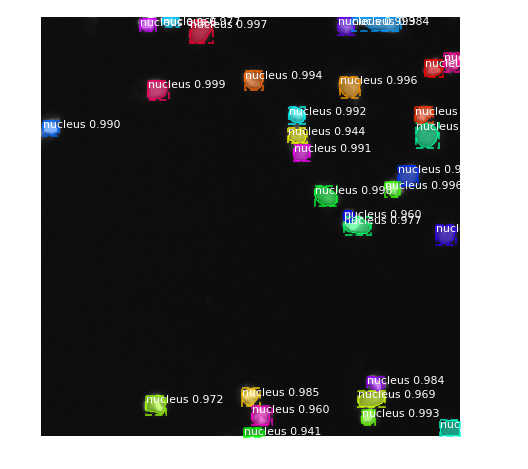

30 masks detected, lowest score is 0.9414183497428894


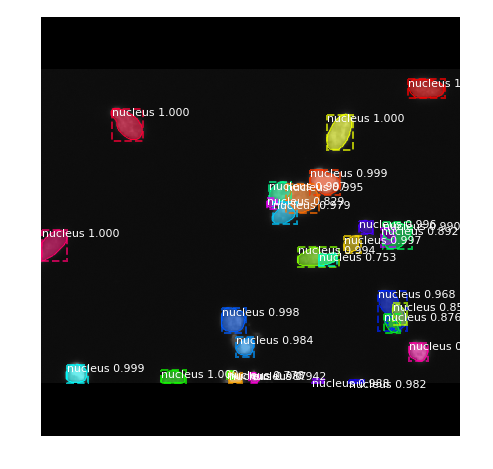

28 masks detected, lowest score is 0.7528096437454224


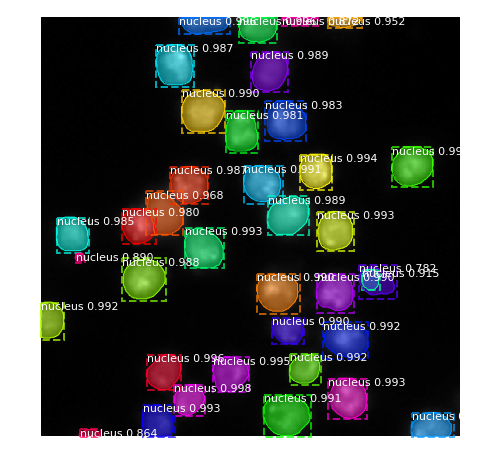

37 masks detected, lowest score is 0.782243549823761
no pixel in mask:7f4cbe0b36b5d09466476a7d4e01f4f976c67872d549f4ff47b3e1e3a2b403af,


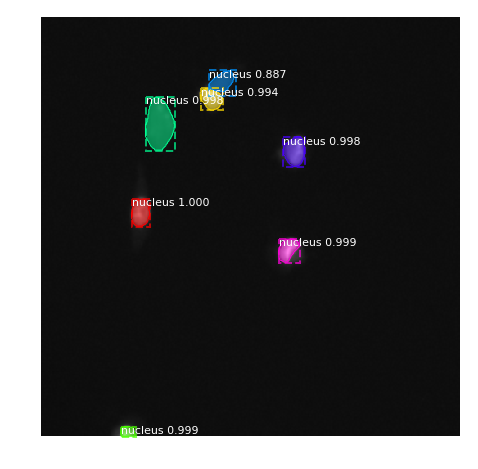

7 masks detected, lowest score is 0.8865716457366943


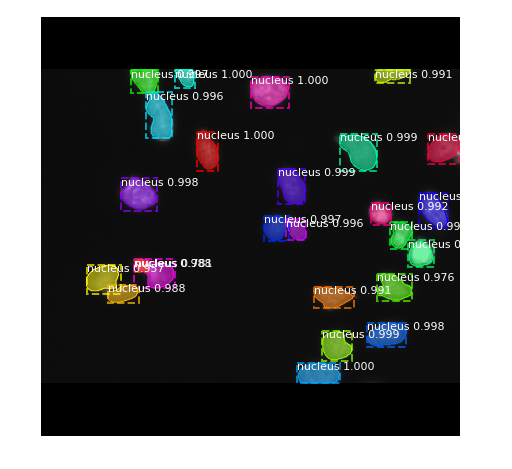

25 masks detected, lowest score is 0.780833899974823


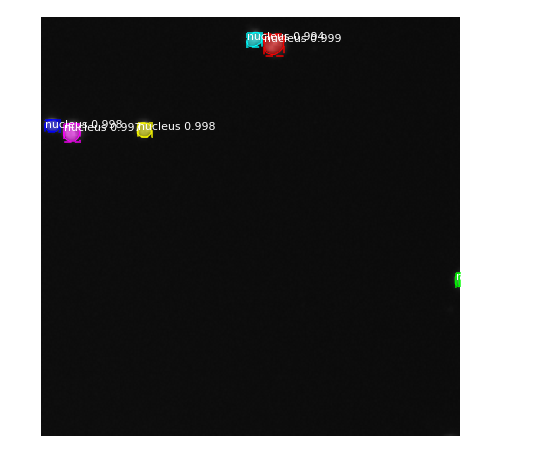

6 masks detected, lowest score is 0.9786289930343628


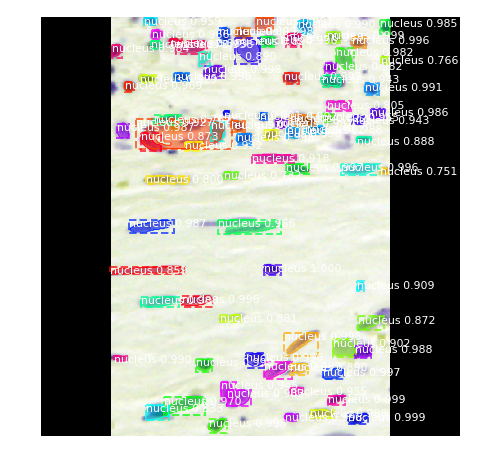

81 masks detected, lowest score is 0.731756329536438


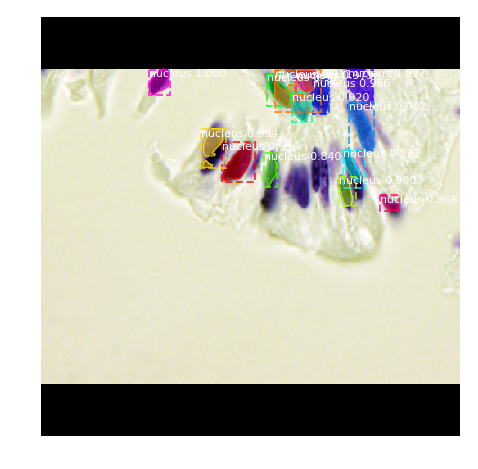

14 masks detected, lowest score is 0.8403518199920654


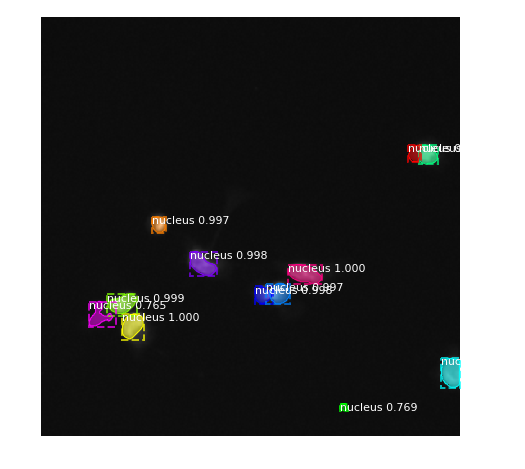

12 masks detected, lowest score is 0.7411818504333496


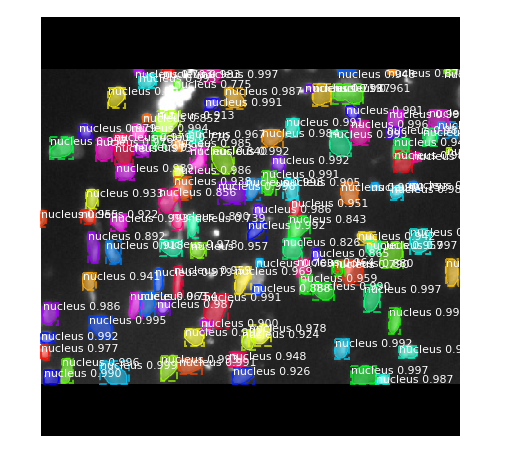

112 masks detected, lowest score is 0.703123152256012


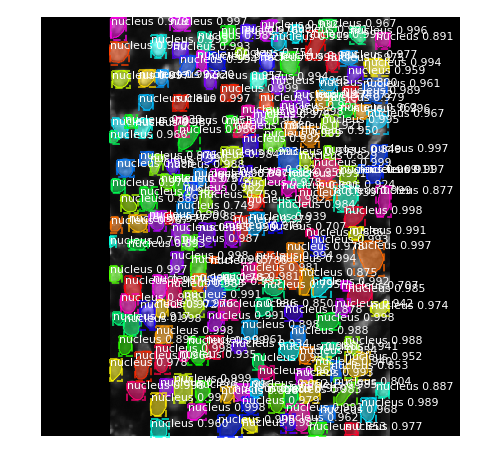

191 masks detected, lowest score is 0.7066798806190491


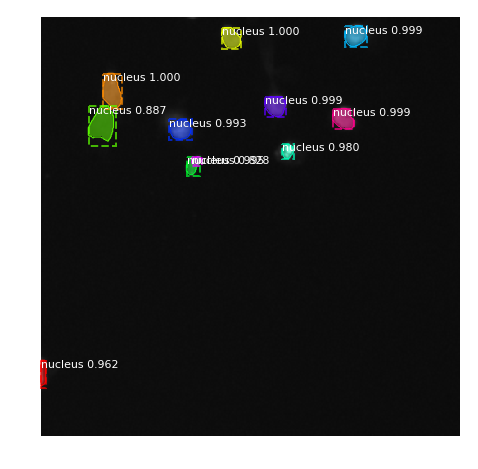

11 masks detected, lowest score is 0.8278449773788452


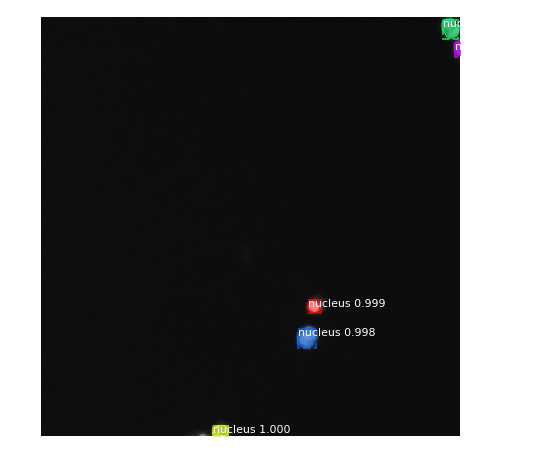

5 masks detected, lowest score is 0.9866917133331299


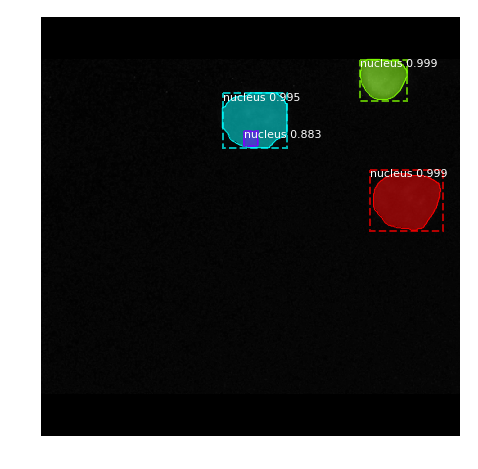

4 masks detected, lowest score is 0.8828901648521423


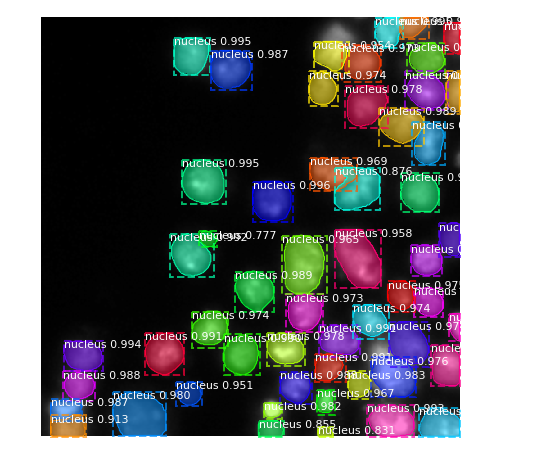

54 masks detected, lowest score is 0.7769851088523865


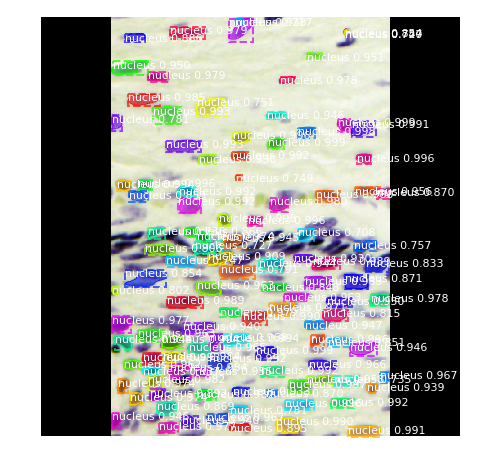

111 masks detected, lowest score is 0.7077563405036926


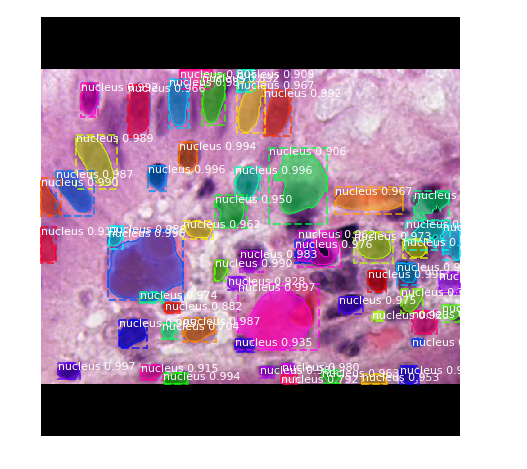

56 masks detected, lowest score is 0.7023329734802246


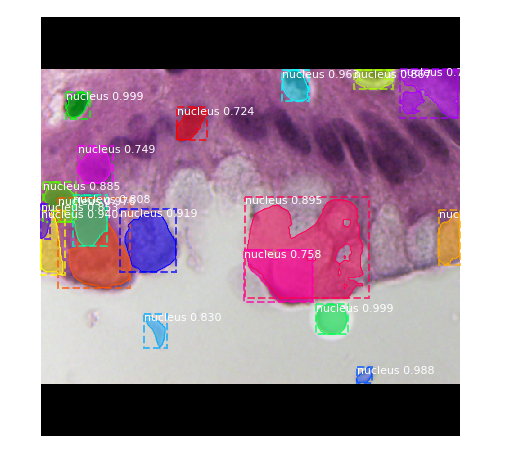

18 masks detected, lowest score is 0.7240625023841858


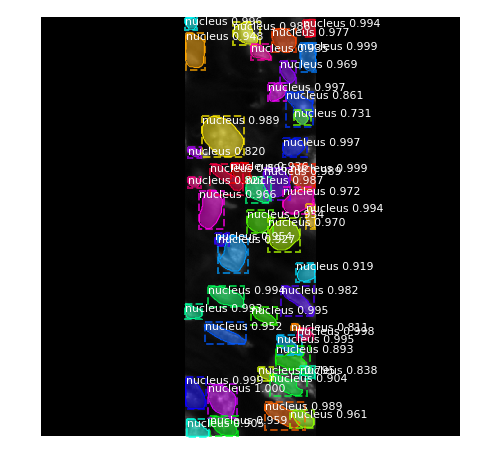

46 masks detected, lowest score is 0.7314043641090393


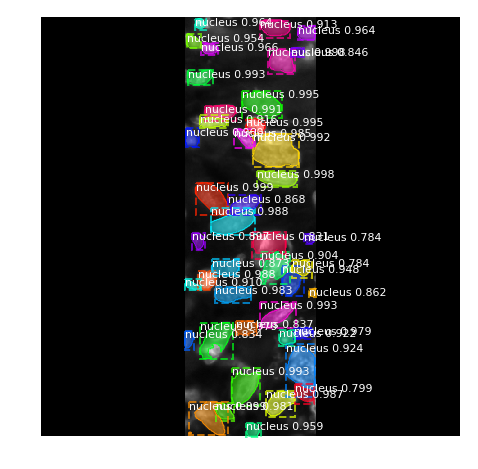

43 masks detected, lowest score is 0.7837315797805786


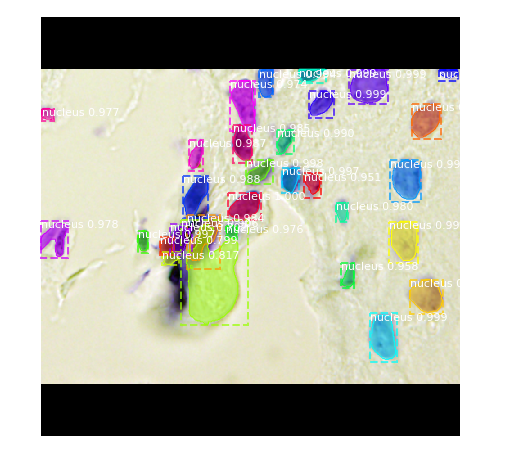

30 masks detected, lowest score is 0.7020331621170044


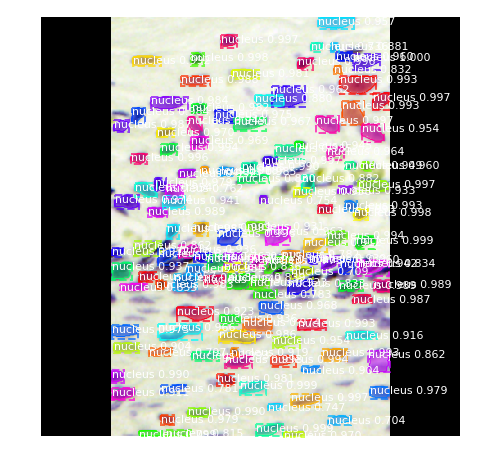

127 masks detected, lowest score is 0.7036882638931274


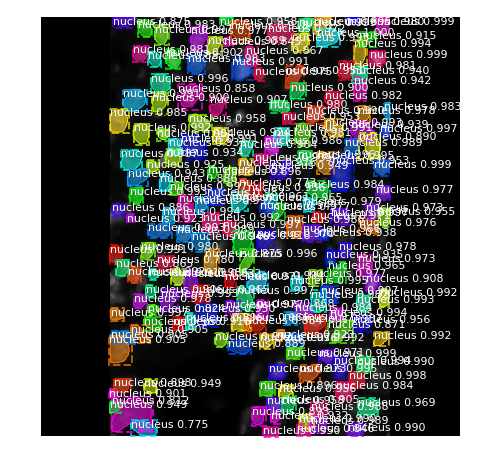

183 masks detected, lowest score is 0.7726664543151855


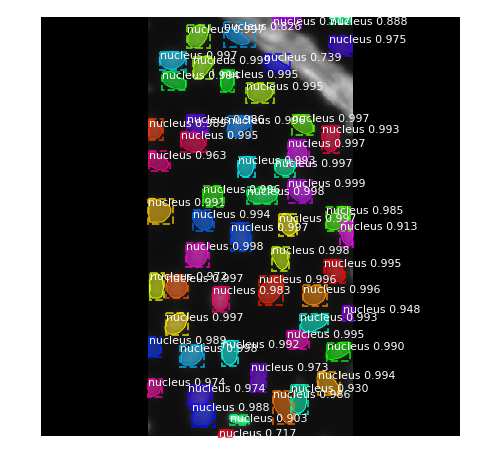

55 masks detected, lowest score is 0.71660977602005


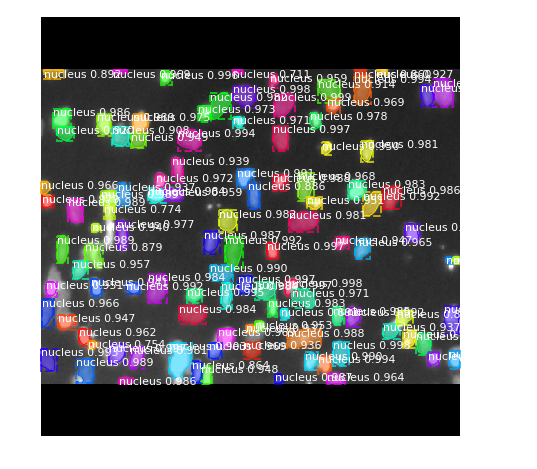

107 masks detected, lowest score is 0.7108737826347351


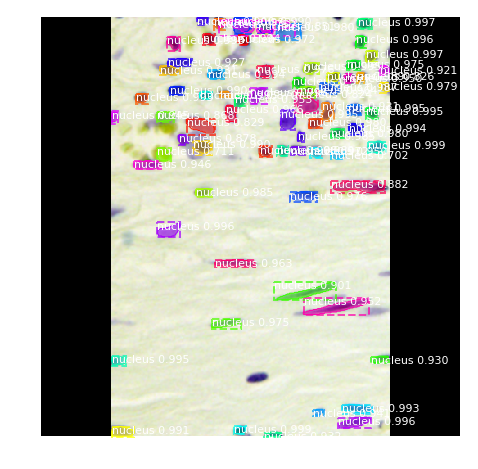

71 masks detected, lowest score is 0.7020016312599182


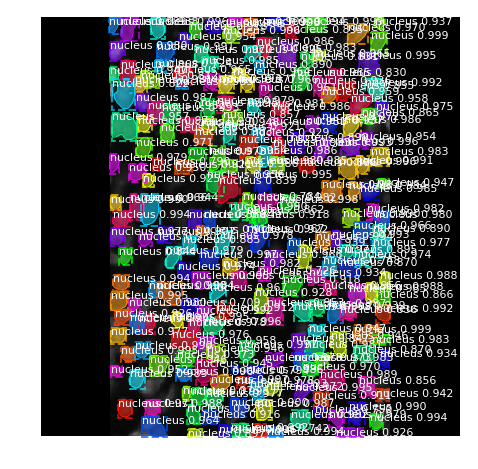

226 masks detected, lowest score is 0.7093106508255005


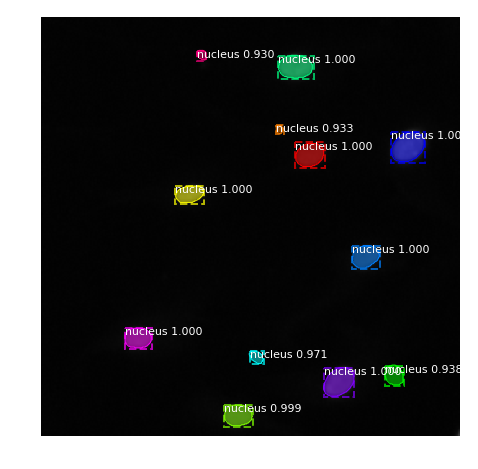

12 masks detected, lowest score is 0.9301685690879822


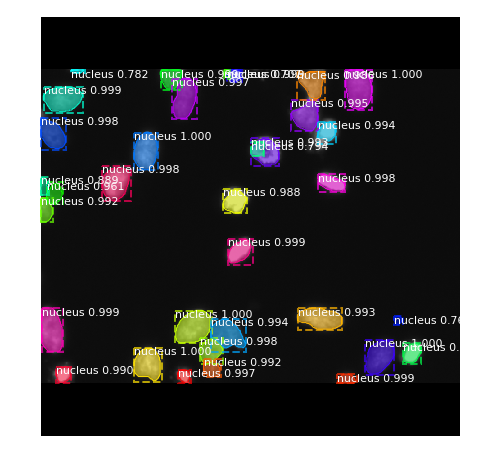

34 masks detected, lowest score is 0.7067956328392029


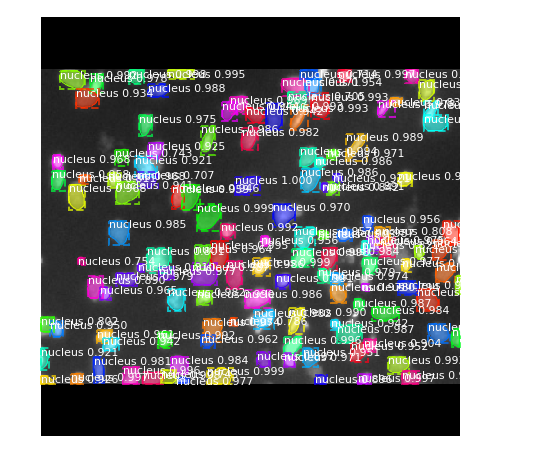

128 masks detected, lowest score is 0.7045171856880188


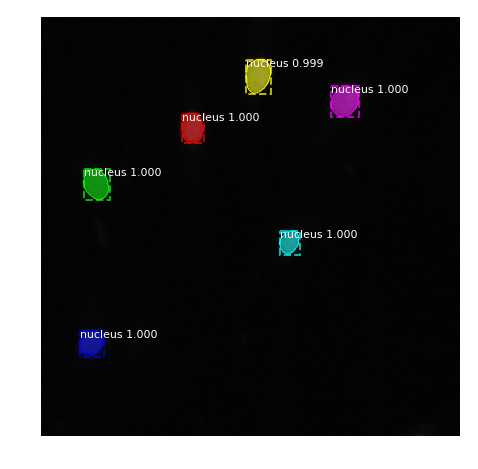

6 masks detected, lowest score is 0.9991335272789001


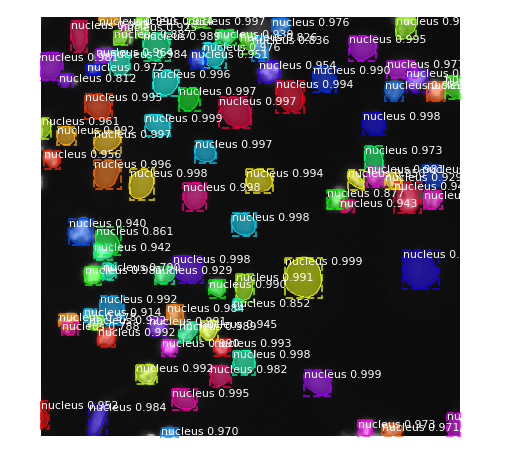

88 masks detected, lowest score is 0.7882431149482727


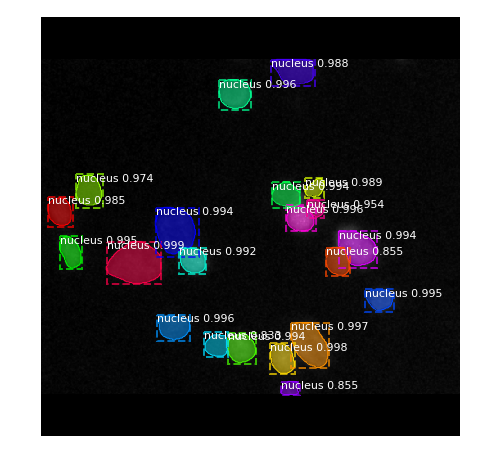

21 masks detected, lowest score is 0.8328457474708557


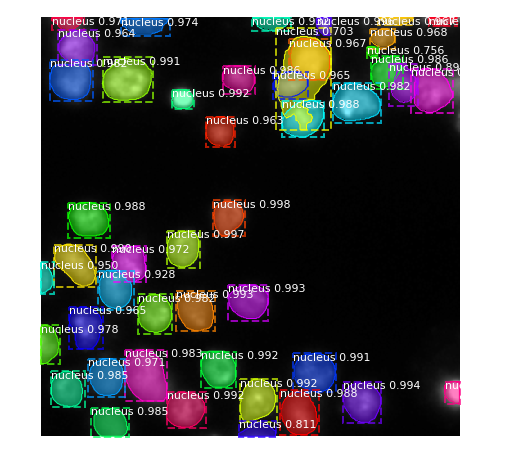

46 masks detected, lowest score is 0.7028944492340088
no pixel in mask:0a849e0eb15faa8a6d7329c3dd66aabe9a294cccb52ed30a90c8ca99092ae732,


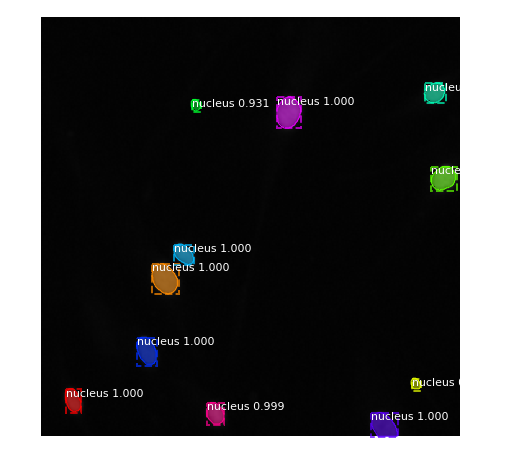

11 masks detected, lowest score is 0.8537095189094543


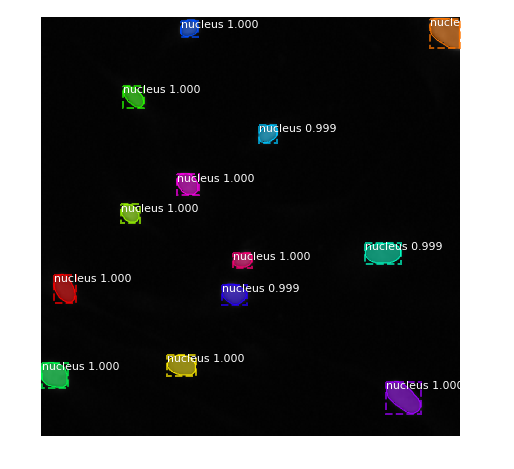

13 masks detected, lowest score is 0.9991521835327148


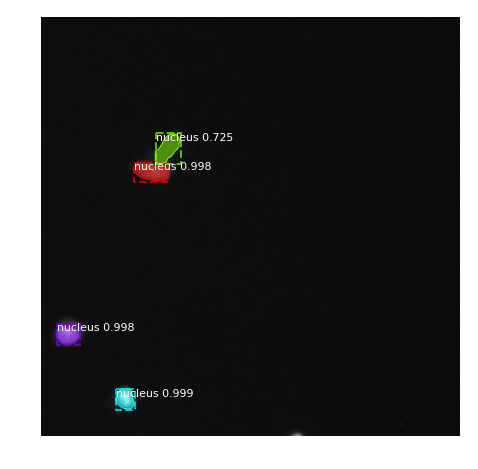

4 masks detected, lowest score is 0.7245009541511536


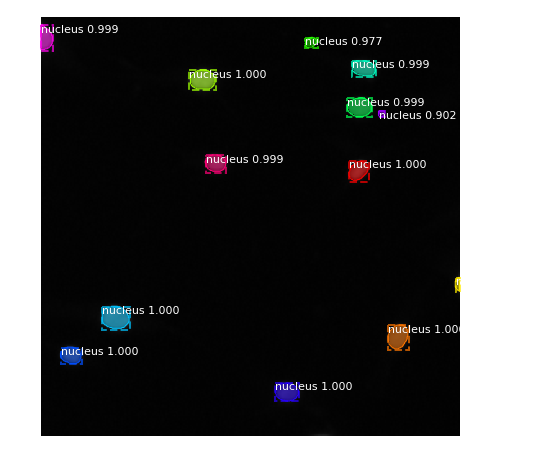

13 masks detected, lowest score is 0.8966696262359619


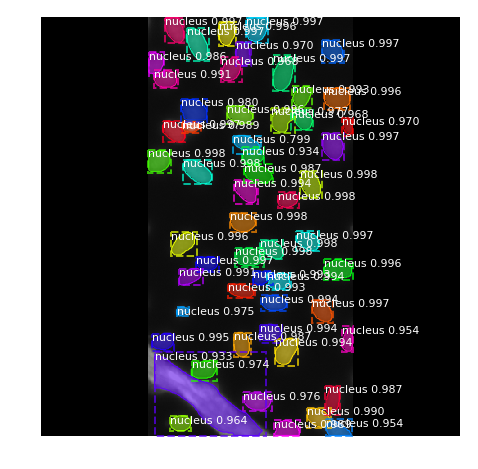

55 masks detected, lowest score is 0.799415647983551


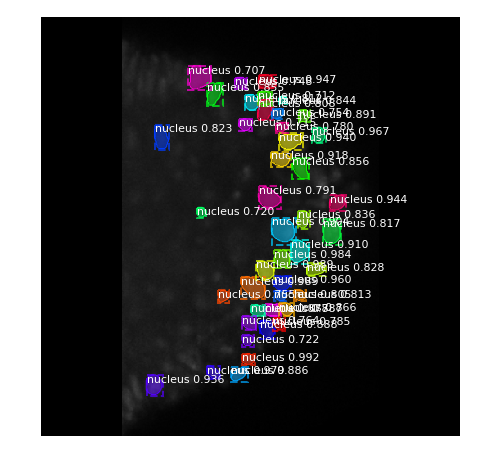

43 masks detected, lowest score is 0.7074382305145264


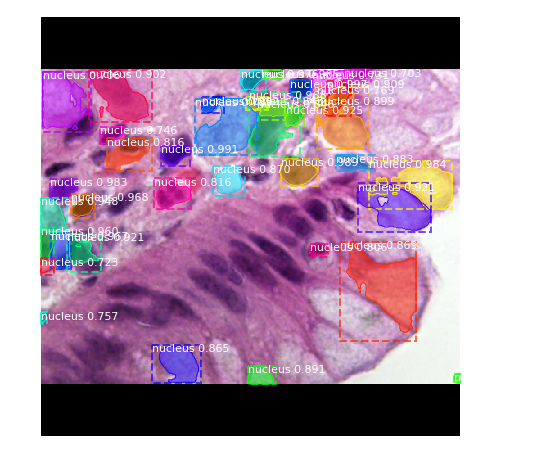

38 masks detected, lowest score is 0.7025128602981567


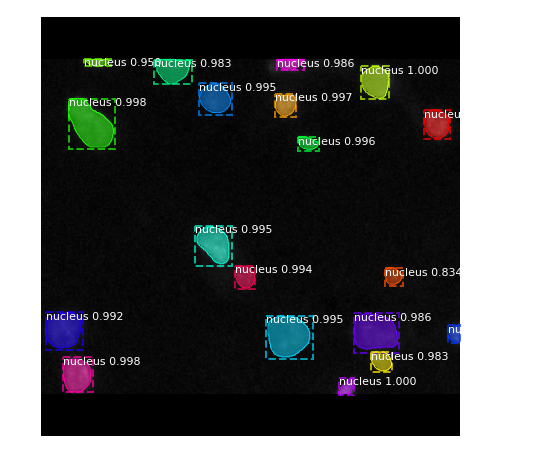

19 masks detected, lowest score is 0.8337253928184509


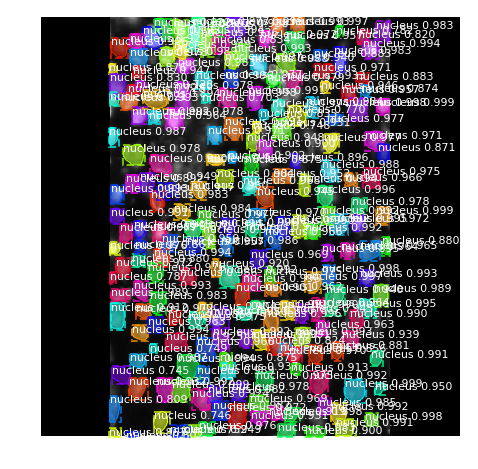

208 masks detected, lowest score is 0.702725350856781


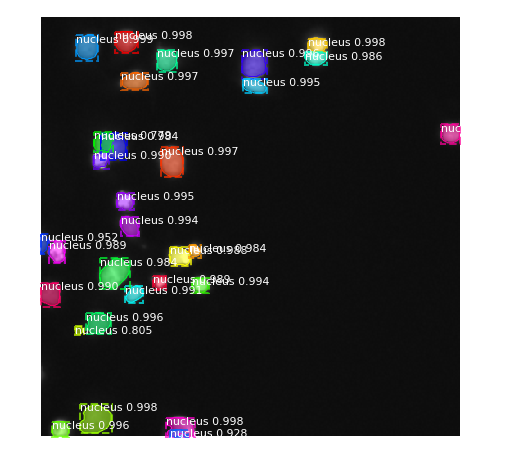

30 masks detected, lowest score is 0.7789968848228455


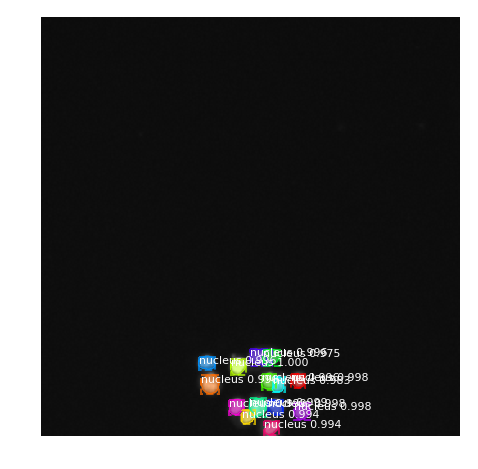

14 masks detected, lowest score is 0.9753742814064026


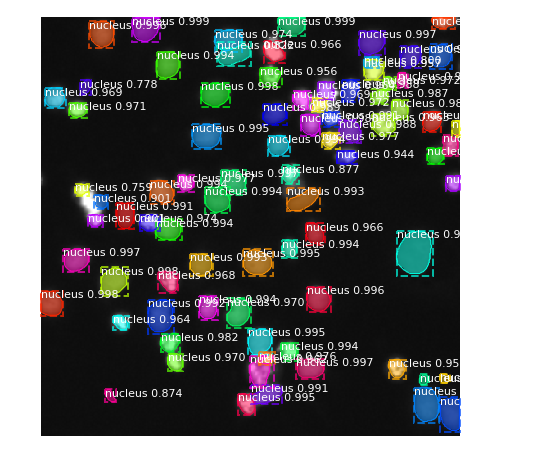

81 masks detected, lowest score is 0.7585522532463074


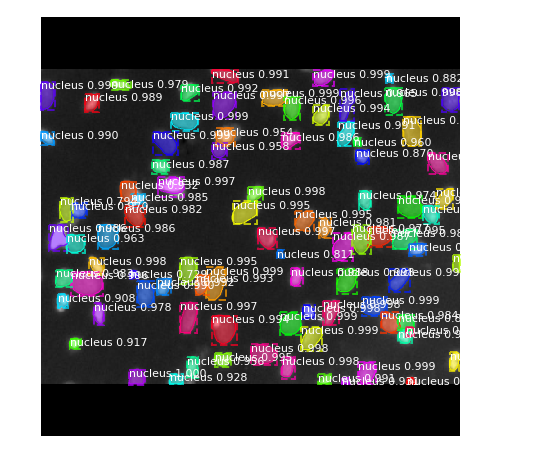

88 masks detected, lowest score is 0.7170573472976685
submision file completed!


In [13]:
import warnings
warnings.filterwarnings('ignore')


# Run-length encoding stolen from https://www.kaggle.com/rakhlin/fast-run-length-encoding-python
# convert single mask shape (h,w) into a list, 1: foreground, 0: background
def rle_encoding(x, total_pixel):
#     total = x.T.flatten().shape[0]
    dots = np.where(x.T.flatten() == 1)[0]
    run_lengths = []
    prev = -2
    for b in dots:
        if (b>prev+1): run_lengths.extend((b + 1, 0))
        run_lengths[-1] += 1
        prev = b
    return run_lengths

from skimage.morphology import binary_dilation
from skimage.morphology import disk
def refineMasks(mask):
    return binary_dilation(mask, disk(1))


def single_image(test):
    lines = []
    image_id =  test['image']['pathname']
    origin_img = imread(os.path.join(base_dir, 'images', test['image']['pathname']))
#     print("origin image shape:{}".format(origin_img.shape))
    resized_img,_, scale,padding = resize_image(origin_img, min_dim=512,max_dim=512, padding=True)
#     print("handing img:{}, scale:{}, padding:{}".format(image_id, scale, padding))


    results = model.detect([resized_img], verbose=0)
    scores = results[0]['scores']
    masks = results[0]['masks']
    visualize.display_instances(resized_img, results[0]['rois'], masks, results[0]['class_ids'], 
                            train_data.class_names, scores, ax=get_ax())
    s0 = 1
    for s in scores:
        if s< s0:
            s0 = s
    print("{} masks detected, lowest score is {}".format(masks.shape[-1], s0))
    
    reverted_masks = []
    for i in range(masks.shape[-1]):
        mask = masks[:,:,i]
        reverted_mask = revert_resizing(mask, origin_img.shape, padding)
        assert(reverted_mask.shape[0] == origin_img.shape[0])
        assert(reverted_mask.shape[1] == origin_img.shape[1])
#         reverted_mask = refineMasks(reverted_mask)
        reverted_masks.append(reverted_mask)
    
    for i in range(len(reverted_masks)):
        for j in range(i+1, len(reverted_masks)):
            interaction = reverted_masks[i]*reverted_masks[j]
            row, col = np.nonzero(interaction)
            if len(row)>0:
#                 print("before, {} pixels overlapping between mask {} and {}".format(len(row), i, j))
                reverted_masks[i][row, col] = 0
#                 print("after, {} pixels overlapping".format(len(np.nonzero(reverted_masks[i]*reverted_masks[j])[0])))
                
    
    for i in range(len(reverted_masks)):
        assert(reverted_masks[i].shape[0] == origin_img.shape[0])
        assert(reverted_masks[i].shape[1] == origin_img.shape[1])
        rle = rle_encoding(reverted_masks[i], origin_img.shape[0]*origin_img.shape[1])
        lines.append("{},{}".format(image_id[:-4],' '.join(map(str, rle))))
    return lines

base_dir = '../DSB2018'
test_set = load_testset(os.path.join(base_dir, 'test.json'))
print("in total {} images to predict".format(len(test_set)))
with open('600_roi.csv', 'w') as f: 
    f.write('ImageId,EncodedPixels\n')
    for i, test in enumerate(test_set):
        lines = single_image(test)
        for line in lines:
            if line.endswith(','):
                print("no pixel in mask:{}".format(line))
                continue
            f.write(line)
            f.write('\n')
    
print("submision file completed!")

In [14]:
print(len(test_set))

65


In [12]:
import numpy as np
a = np.array([[1,1,0], [0,0,0], [1,0,0]])
b = np.array([[0,0,0], [0,0,0], [0,0,0]])
print(a*b)
len(np.nonzero(a*b)[0]) == 0

[[0 0 0]
 [0 0 0]
 [0 0 0]]


True

In [21]:
for i in range(1, 10):
    print(i)

1
2
3
4
5
6
7
8
9
